# 心衰数据生存分析模型建立与预测  
2021.10.22

## 数据字段说明

- age: age of the patient (years)
- anaemia: decrease of red blood cells or hemoglobin (boolean)
- high blood pressure: if the patient has hypertension (boolean)
- creatinine phosphokinase (CPK): level of the CPK enzyme in the blood (mcg/L)
- diabetes: if the patient has diabetes (boolean)
- ejection fraction: percentage of blood leaving the heart at each contraction (percentage)
- platelets: platelets in the blood (kiloplatelets/mL)
- sex: woman or man (binary)
- serum creatinine: level of serum creatinine in the blood (mg/dL)
- serum sodium: level of serum sodium in the blood (mEq/L)
- smoking: if the patient smokes or not (boolean)
- time: follow-up period (days)
- [target] death event: if the patient deceased during the follow-up period (boolean)

In [19]:
%matplotlib inline
import matplotlib.pyplot as plt 
import plotly.express as px
import pandas as pd 
import numpy as np
from sksurv.ensemble import RandomSurvivalForest
from sksurv import util
from sksurv.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
import eli5
from eli5.sklearn import PermutationImportance
import pickle
import sidetable
from dataprep import eda 
import shap

In [3]:
all_data = pd.read_csv('./heart_failure_clinical_records_dataset.csv')

In [3]:
all_data.head()  

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1


In [4]:
all_data.describe() 

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
count,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.00000,299.000000,299.000000,299.00000,299.000000,299.00000
mean,60.833893,0.431438,581.839465,0.418060,38.083612,0.351171,263358.029264,1.39388,136.625418,0.648829,0.32107,130.260870,0.32107
std,11.894809,0.496107,970.287881,0.494067,11.834841,0.478136,97804.236869,1.03451,4.412477,0.478136,0.46767,77.614208,0.46767
min,40.000000,0.000000,23.000000,0.000000,14.000000,0.000000,25100.000000,0.50000,113.000000,0.000000,0.00000,4.000000,0.00000
25%,51.000000,0.000000,116.500000,0.000000,30.000000,0.000000,212500.000000,0.90000,134.000000,0.000000,0.00000,73.000000,0.00000
50%,60.000000,0.000000,250.000000,0.000000,38.000000,0.000000,262000.000000,1.10000,137.000000,1.000000,0.00000,115.000000,0.00000
75%,70.000000,1.000000,582.000000,1.000000,45.000000,1.000000,303500.000000,1.40000,140.000000,1.000000,1.00000,203.000000,1.00000
max,95.000000,1.000000,7861.000000,1.000000,80.000000,1.000000,850000.000000,9.40000,148.000000,1.000000,1.00000,285.000000,1.00000


## 查看字段信息缺失情况

In [6]:
all_data.stb.missing()

,missing,total,percent
age,0,299,0.0
anaemia,0,299,0.0
creatinine_phosphokinase,0,299,0.0
diabetes,0,299,0.0
ejection_fraction,0,299,0.0
high_blood_pressure,0,299,0.0
platelets,0,299,0.0
serum_creatinine,0,299,0.0
serum_sodium,0,299,0.0
sex,0,299,0.0


## 快速建立整个数据集的EDA信息

  0%|          | 0/2026 [00:00<?, ?it/s]

DataPrep Report
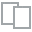
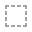
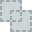
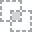
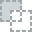
...
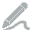
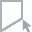
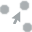
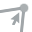
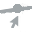

In [8]:
eda.create_report(all_data)

## 分离特征和标签数据

In [11]:
X = all_data.iloc[:,:-2]
y = all_data.iloc[:,-2:]

In [12]:
#Sksurv要求时间必须是bool类型，所以预测标签需要进行处理后才能使用
y

,time,DEATH_EVENT
0,4,1
1,6,1
2,7,1
3,7,1
4,8,1
...,...,...
294,270,0
295,271,0
296,278,0
297,280,0


##  使用Sksurv自带的util生成符合建模的事件与时间格式

In [13]:
y=util.Surv.from_dataframe('DEATH_EVENT','time',y) 

## 建立随机生存森林对象

In [14]:
rsf = RandomSurvivalForest(n_estimators=1000,
                           min_samples_split=10,
                           min_samples_leaf=15,
                           max_features='sqrt',
                           n_jobs=-1,
                           random_state=39)

In [16]:
X_train,X_test, y_train,y_test = train_test_split(X,y,random_state=39)

In [17]:
rsf.fit(X_train,y_train) 

RandomSurvivalForest(max_features='sqrt', min_samples_leaf=15,
                     min_samples_split=10, n_estimators=1000, n_jobs=-1,
                     random_state=39)

## 查看针对测试集的C-index值

In [18]:
rsf.score(X_test,y_test)

0.7451957295373666

## 生成针对测试集中前5条数据的生存概率线性图

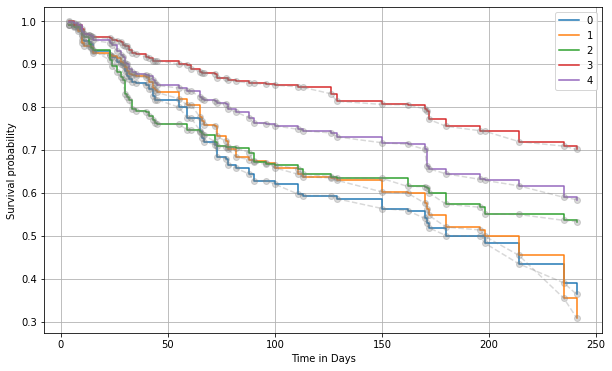

In [20]:
plt.figure(figsize=(10,6))
surv = rsf.predict_survival_function(X_test.head(), return_array=True)

for i, s in enumerate(surv):
    plt.step(rsf.event_times_, s, where="post", label=str(i))
    plt.plot(rsf.event_times_, s, 'o--', color='grey', alpha=0.3)
plt.ylabel("Survival probability")
plt.xlabel("Time in Days")
plt.legend()
plt.grid(True)

## 生成针对测试集中前5条数据的累积风险图

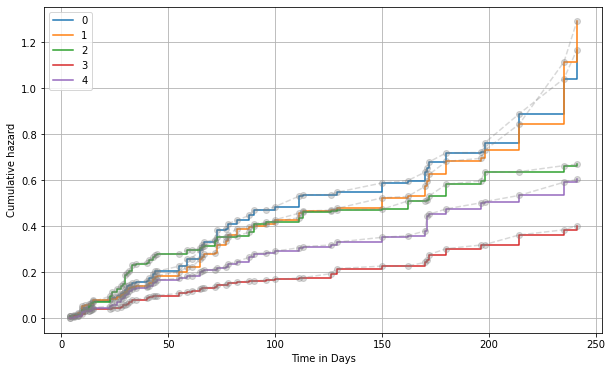

In [21]:
plt.figure(figsize=(10,6))
surv = rsf.predict_cumulative_hazard_function(X_test.head(), return_array=True)

for i, s in enumerate(surv):
    plt.step(rsf.event_times_, s, where="post", label=str(i))
    plt.plot(rsf.event_times_, s, 'o--', color='grey', alpha=0.3)
plt.ylabel("Cumulative hazard")
plt.xlabel("Time in Days")
plt.legend()
plt.grid(True)

## 构造针对全集数据的随机生存森林模型

In [64]:
rsf_all = RandomSurvivalForest(n_estimators=1000,
                           min_samples_split=10,
                           min_samples_leaf=15,
                           max_features='sqrt',
                           n_jobs=-1,
                           random_state=39)

In [67]:
#在完整数据集上进行训练。理由是今后用来进行预测的数据都不在本数据集中。
rsf_all.fit(X,y)

RandomSurvivalForest(max_features='sqrt', min_samples_leaf=15,
                     min_samples_split=10, n_estimators=1000, n_jobs=-1,
                     random_state=39)

## 查看完整数据集上的C-Index

In [66]:
rsf_all.score(X,y)

0.8035628541246519

In [68]:
#初始化shap的显示，这步一定需要，否则下面的显示会有问题
shap.initjs()

##  建立针对完整数据集的解释数据。 这个需要花一些时间，时间长短跟机器性能有关

In [35]:
explainer = shap.Explainer(rsf_all.predict, X, feature_names=X.columns)
shaps = explainer(X)

Permutation explainer: 300it [13:41,  2.77s/it]                         


## 任意查看针对某一条记录的解释结果

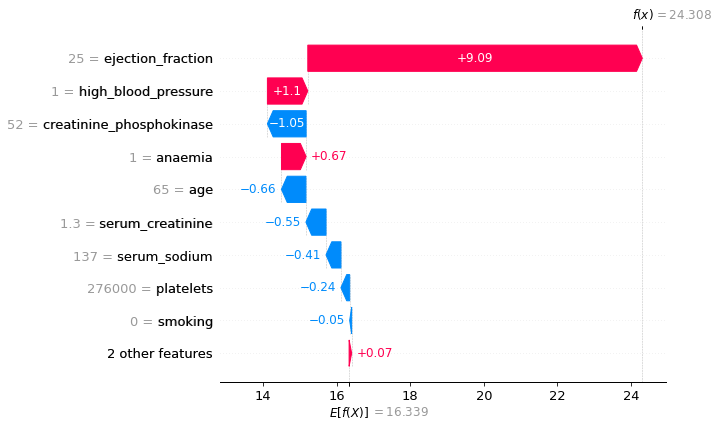

In [37]:
#Waterfall图
shap.plots.waterfall(shaps[20])

In [70]:
#力量图（force）
shap.force_plot(shaps[20])

In [75]:
shap.force_plot(shaps[123])

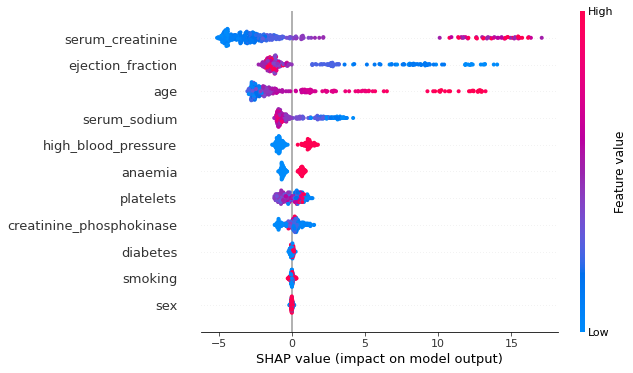

In [41]:
#简介图
shap.summary_plot(shaps)

## 此处用Eli5的PermutationImportance来查看下全局下每个特征的权重  
（只做参考以及与SHAP的对比）

In [62]:
perm = PermutationImportance(rsf_all, n_iter=15, random_state=39)
perm.fit(X, y)
eli5.show_weights(perm, feature_names=X.columns.tolist())

Weight,Feature
0.0896 ± 0.0355,serum_creatinine
0.0738 ± 0.0260,ejection_fraction
0.0514 ± 0.0147,age
0.0096 ± 0.0047,creatinine_phosphokinase
0.0092 ± 0.0050,platelets
0.0079 ± 0.0051,high_blood_pressure
0.0058 ± 0.0068,serum_sodium
0.0050 ± 0.0035,anaemia
0.0026 ± 0.0013,smoking
0.0018 ± 0.0014,diabetes


## 导出模型和完整解释， 以用于后续使用

In [47]:
pickle.dump(rsf_all,open('rsf_all.pkl','wb'))
pickle.dump(explainer, open('explainer_all.sav', 'wb'))

## 测试一下，读入导出的模型和解释方案  
测试模型

In [50]:
rsf_file = pickle.load(open('rsf_all.pkl','rb'))

In [57]:
surv_file = rsf_file.predict_survival_function(all_data.iloc[10:15,:-2], return_array=True)

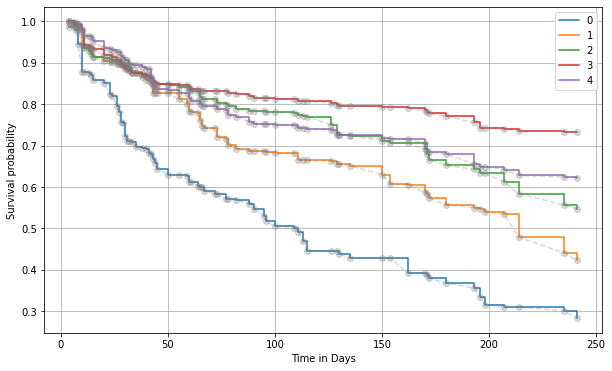

In [58]:
plt.figure(figsize=(10,6))
for i, s in enumerate(surv_file):
    plt.step(rsf_file.event_times_, s, where="post", label=str(i))
    plt.plot(rsf_file.event_times_, s, 'o--', color='grey', alpha=0.3)
plt.ylabel("Survival probability")
plt.xlabel("Time in Days")
plt.legend()
plt.grid(True)

测试解释 

In [48]:
ex_file = pickle.load(open('explainer_all.sav','rb'))
shaps_file=ex_file(X.head(1)) 

In [61]:
shap.force_plot(shaps_file[0])